In [ ]:
# !unzip "drive/MyDrive/Colab Notebooks/Dog vision/dog-breed-identification (1).zip" -d "drive/MyDrive/Colab Notebooks/Dog vision/"

## End to end dog breed prediction

This notebook builds an end-to-end multi-class image classifier using TenseorFlow 2.0 and TenserFlow hub.


## 1. Problem
 Indentifying the breed of a dog given an image of a dog.

## 2. Data

The data im using is from kaggle's dog breed identification compotition.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each rest image.

## 4. Features

Some informaton about the data:
* i'm dealing with images (unstructured data) so it's probably best i use deep learning/transfer learning.
* There are 120 breed of dogs (this means there are 120 different classes).
* There are around 10.000+ images in the test set (these images have no labels, because i'll want to predict them).

Get my workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure i'm using GPU

In [1]:
# Import TenserFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.13.0


In [2]:
from IPython.core.interactiveshell import available_events
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSSS)" if tf.config.list_physical_devices("GPU") else "not available :(")




TF version: 2.13.0
TF Hub version: 0.14.0
GPU available (YESSSSS)


## Getting data ready (turning into tensors)

with all machine learning models, the data has to be in numercial format. so that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start accessing our data and checking out the labels.


In [3]:
#Checkout the labels of data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Colab Notebooks/Dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

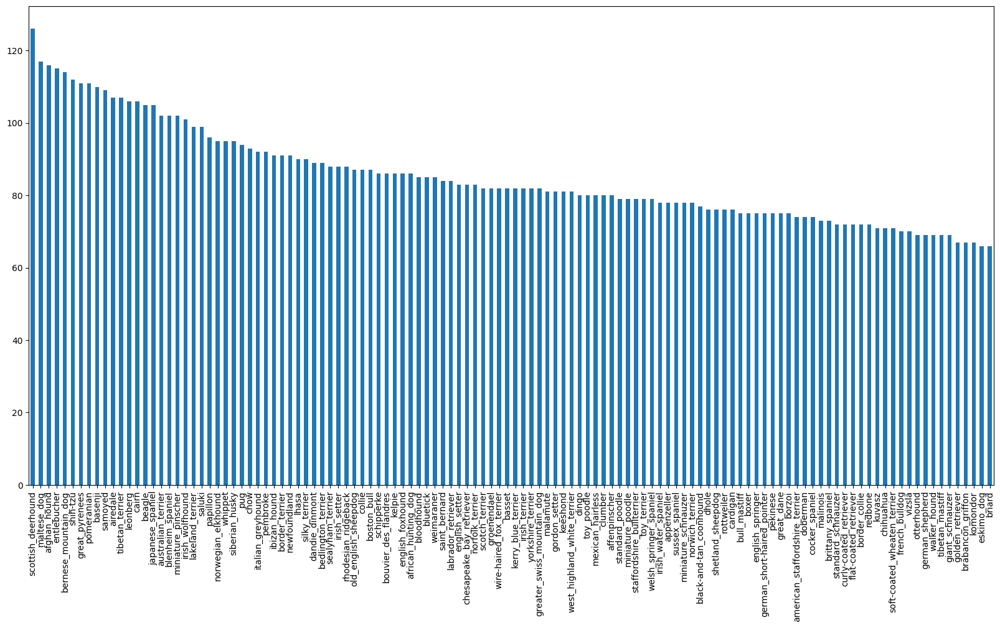

In [5]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [6]:
labels_csv["breed"].value_counts().median()

82.0

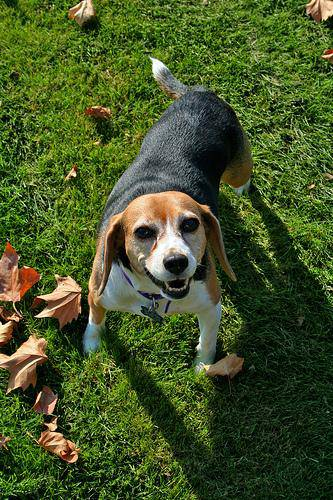

In [7]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/Dog vision/train/0566a60d7504a6fad4161d0ef2765a34.jpg")

### Getting images and their label

list of all image file pathname

In [8]:
# Create pathname from image ID's
filenames = ["drive/MyDrive/Colab Notebooks/Dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Colab Notebooks/Dog vision/train/")) == len(filenames):
  print("filenames match actual amount of files")
else:
  print("filenames do not match actual amount")

filenames match actual amount of files


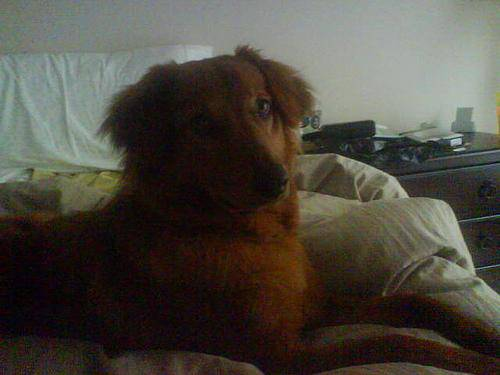

In [10]:
# One more chcek
Image(filenames[1000])

In [11]:
labels_csv["breed"][1000]

'irish_setter'

Since no training image filepaths in a list, lables need to be prepared

In [12]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [13]:
len(labels)

10222

In [14]:
# see if number of a labels matches the number of filename
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does npt match number of filenames, check data directories")

Number of labels matches number of filenames!


In [15]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
# Turn single label arry into boleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [17]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
# Example: Turning boolean example inro integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int))# there will be a 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [19]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [20]:
filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [21]:
### Creating my own validation set


In [22]:
# set up X and y varibles
X = filenames
y = boolean_labels

i'm going to start expereminting with ~1000 images and increase as needed

In [23]:
# Sey number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step: 1000}

In [24]:
# splitting data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [25]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Colab Notebooks/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab Notebooks/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Colab Notebooks/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Colab Notebooks/Dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Colab Notebooks/Dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False,

## preprocessing Images (turning images into tensors)

To preprocess images into Tensords i need to write a function which does a few things:
1. Take an image filepath as input
2. use tensorFlow tp read the file and save it to a variabel, `image`
3. Turn `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modifed `image`

In [26]:
# Convert image to numPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [27]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [28]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now i konw what an image looks like as a Tensor. function to preprocess them

1. Take an image filepath as input
2. use tensorFlow tp read the file and save it to a variabel, `image`
3. Turn `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modifed `image`

In [29]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn jpg image into numerical tensor with 3 colour channels (Red, Green,Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning data into batches

Why turning data into batches?

trying to process 10,000+ images in one go... they all might not fit into memory.

so that why do about 32 (this is batch size) images at a time (btach size can be manually adjusted if need be)

In order to use TenserFlow effectively,data need to be in the form of Tensor tuples which look like this:
`(image, label)`.

In [30]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and returns a tuple of (image, label),
  """
  image = process_image(image_path)
  return image, label

In [31]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

now i've got a way to turn data into tuples of Tensors
in the form: `(image, label)`, let's make function to turn all of data (`X` & `y`) into batches

In [32]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of images (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, i probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, it's doesn't need to be shuffled
  elif valid_data:
    print("creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels mapping image processor function is fater than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [33]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
creating validation data batches...


In [34]:
# Check out the different attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data batches

Data is now in batches, however, these can be little hard to understand let's visualize them.

In [35]:
import matplotlib.pyplot as plt

# Create a function for viewing images in data batches
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels fro a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    #plt.axis("off")

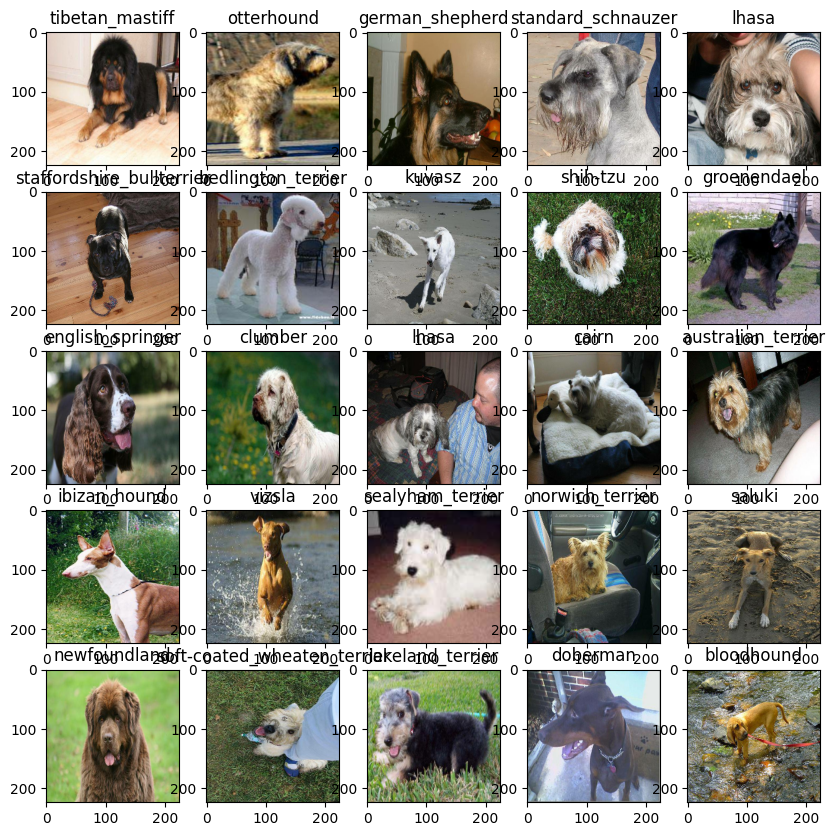

In [36]:
# Now i visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

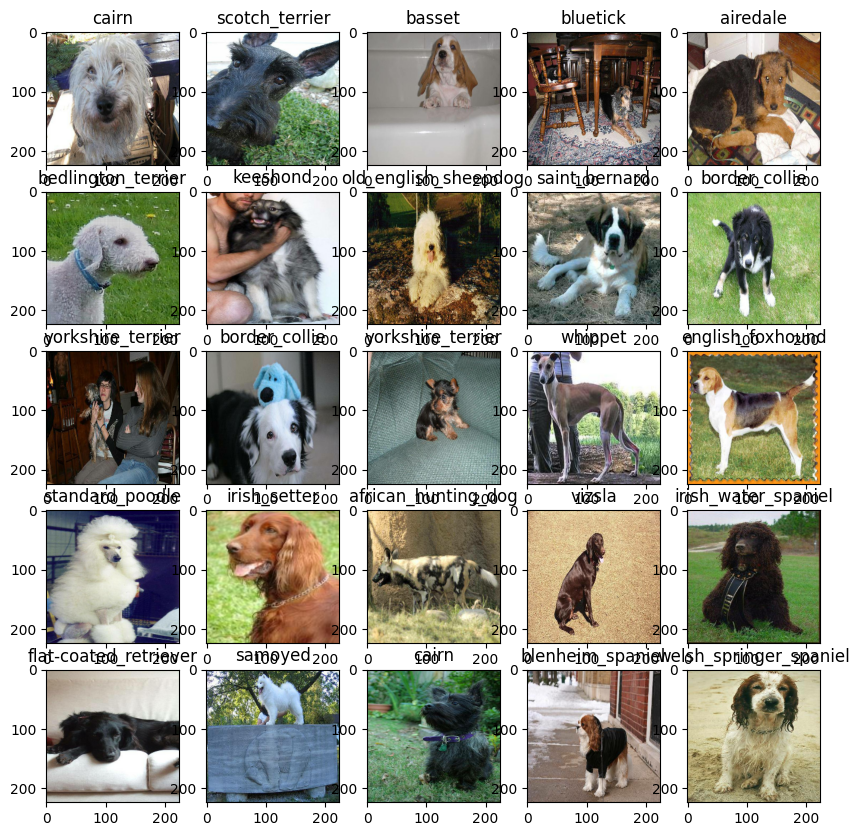

In [37]:
# Visualizetion pf the data in the training batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before building a model, there are few things needed to be defiend:
* The input shape (images shape in a from of tensors) to my model.
* output shape (image labels, in the form o tensors) of my model.
* The URL of the model i want use.

In [38]:
# Setup unput to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# setup output of my model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TenseorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now i gout my inputs, outputs and model ready to go.
now i need to put them together into Keras deep learning model!

Knowing this, let;s create a function which:
* Takes the input shape, output shape and the model i've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.


All of these steps can be found here:

In [39]:
# Create function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # set up model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                           activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [40]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callback are helper functions a model can use during training to do such things as save it's proggress, check it's progress or stop trainign early if a model stops improving.

i'll create two call backs, one for TensorBoard which helps track my models progress and anotherfor early stopping which prevents my model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback i need to do 3 things

1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to my model's `fit()` function.
3. Visualize my model training logs with the `%tensorboard` magic function (i'll do this after model training.

In [41]:

# Load TensorBoard notebook extension
%load_ext tensorboard

In [42]:
import datetime

# Create a function to build a tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Colab Notebooks/Dog vision/logs",
                         # Make it so the logs get tracked whenver i run an experiment
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping Callback

Early stopping helps stop my model by overfitting by stopping training if a certain evaluation metric stops improving.

In [43]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

my first model is only going to train on 1000 images, to make sure everything is working

In [44]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100,step:10}

In [45]:
# Check to make sure i'll still running on GPU
print("GPU", "available (YESSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!)



Let's create a function which trains a model.

* Create a model using `create_midel()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
*call the `fit()` function on my model passig it on the training data, validation daata, number of ephocs to train for (`NUM_EPOCHS`) and the callbacks i'd like to use
* Return the model

In [46]:
# build the function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime i train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks i created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return tthe fited model
  return model


In [47]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 120s 3s/step - loss: 4.6907 - accuracy: 0.0862 - val_loss: 3.4930 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 3s 126ms/step - loss: 1.6961 - accuracy: 0.6700 - val_loss: 2.1689 - val_accuracy: 0.4650
Epoch 3/100
25/25 [==============================] - 3s 105ms/step - loss: 0.5882 - accuracy: 0.9362 - val_loss: 1.6771 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 3s 108ms/step - loss: 0.2618 - accuracy: 0.9825 - val_loss: 1.4915 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 3s 131ms/step - loss: 0.1502 - accuracy: 0.9962 - val_loss: 1.3999 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 3s 110ms/step - loss: 0.1028 - accuracy: 1.0000 - val_loss: 1.3533 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================]

**Question:** It looks like model is overfitting because it's preforming fat better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! it means model is learning

### Checking the TensorBoard logs

The tensorBoard magic function (`&tensorboard`) will access the logs directory we created earlier and visualize it's contents.

In [48]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/Dog\ vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions  using a trained model

In [49]:
# Make prediction on validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 81ms/step


array([[4.7613849e-04, 4.9433547e-05, 1.4773959e-03, ..., 6.1646017e-05,
        1.8661000e-05, 4.3898779e-03],
       [1.2539368e-03, 4.0197503e-04, 5.8807330e-03, ..., 1.7803042e-04,
        1.2250891e-03, 8.4328793e-05],
       [2.8023428e-06, 2.3205612e-05, 9.1106167e-06, ..., 1.3285660e-05,
        2.2580198e-05, 2.9963350e-05],
       ...,
       [1.6594159e-06, 3.7007863e-05, 1.0500887e-04, ..., 5.1334559e-06,
        1.7876738e-04, 1.6882055e-04],
       [2.3797911e-03, 1.7305392e-04, 9.9588266e-05, ..., 7.4067590e-05,
        3.2397566e-05, 4.6877810e-03],
       [2.7605109e-03, 3.0915146e-06, 3.7872797e-04, ..., 8.6072972e-03,
        2.3348101e-03, 6.9564558e-05]], dtype=float32)

In [50]:
predictions[0]

array([4.76138492e-04, 4.94335472e-05, 1.47739588e-03, 1.85262426e-04,
       1.67748585e-04, 5.87021095e-05, 2.05034856e-02, 1.06779672e-03,
       1.37813811e-04, 2.94574333e-04, 4.45379963e-04, 2.12851650e-04,
       3.47233261e-04, 5.19284804e-05, 5.46063122e-04, 5.06994489e-04,
       3.14351550e-04, 1.82225659e-01, 1.48102336e-05, 4.02721744e-05,
       5.13434759e-04, 1.34118003e-04, 1.70657004e-05, 1.63498195e-03,
       5.47972704e-05, 6.47903726e-05, 4.77652065e-02, 1.58574170e-04,
       2.31199476e-04, 6.53311436e-05, 3.53345444e-04, 1.82636757e-03,
       4.28975822e-04, 2.00268405e-05, 9.02565444e-05, 3.98073830e-02,
       2.36300853e-04, 2.78401363e-04, 7.58307433e-05, 2.41623362e-04,
       5.26158139e-04, 2.18560472e-05, 1.59360075e-04, 4.88505902e-05,
       1.17246000e-05, 4.34238696e-04, 8.05151722e-05, 1.83020078e-04,
       1.02660374e-03, 8.70161923e-04, 2.57451047e-05, 9.97813040e-05,
       6.03023043e-04, 4.63904027e-04, 4.84640586e-05, 6.66211417e-05,
      

Having the above functionality is great buti want to ve able to do it at scale.

ANd it woud be even better if i could see the imag the prediction is being made on!

**Note:** Prediction probabilities are alspo known as confidence levels.

In [51]:
# Turn prediction  probabilities into their respectie label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilites into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilites
pred_label = get_pred_label(predictions[82])
pred_label

'pekinese'

Since my validation data is still in a batch dataset,
we'll have to unbatchify it to make predictions on the validation images and the compare those predictions to the validation labels (truth labels).

In [52]:
 # Create function to unbach a tach dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays of images and labels.
  """
  images = []
  labels = []
# Loop through unbached data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now i've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

make some function to make these all a bit more visaukize.

Create a function of prediction probabilites, an array if truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, it's predicted probability, the truth label and the tarher image on the single plot

In [53]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = 'red'
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                   color=color)


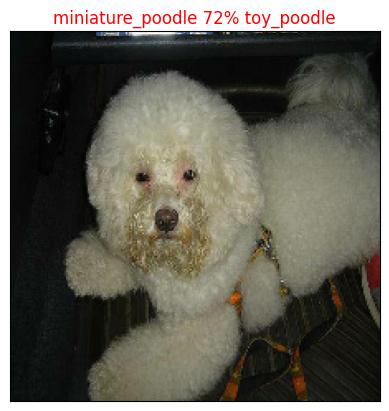

In [54]:
plot_pred(prediction_probabilities=predictions,
labels=val_labels,
images=val_images,
n=44)

Now ive got one function to visualize my model top prediction, let's make aother to view my models top 10 predictions.

This functions will:
* Take an input of prediction probabilites array and a ground truth arraya and an integer
* Find the predictions using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * prediction probabilities values
  * Predictions labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [55]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highes prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 predictions confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 predictions labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

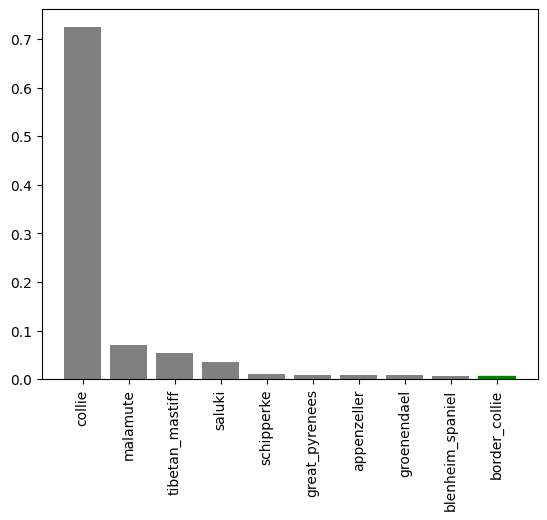

In [56]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now i've got some function to help visualize my predictions and evaluate my model, let's check out a few.

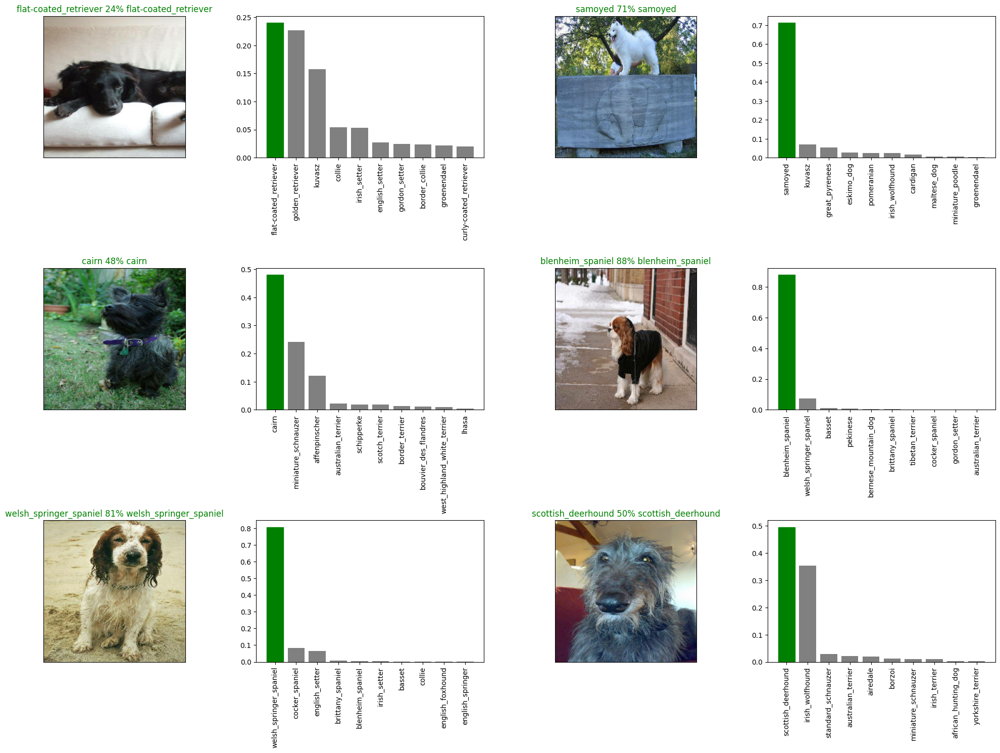

In [57]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows =3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would i create a confusion matrix with my models predictions and true labels?

## Saving and realoding trained model

In [58]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in models directory and appends suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Colab Notebooks/Dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [59]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now i've got functions to save and load trained model, let's make sure they work!

In [60]:
# Save my model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Colab Notebooks/Dog vision/models/20230913-11071694603252-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Colab Notebooks/Dog vision/models/20230913-11071694603252-1000-images-mobilenetv2-Adam.h5'

In [61]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Colab Notebooks/Dog vision/models/20230803-16201691079623-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Colab Notebooks/Dog vision/models/20230803-16201691079623-1000-images-mobilenetv2-Adam.h5


In [62]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 111ms/step - loss: 1.2224 - accuracy: 0.6800


[1.2223923206329346, 0.6800000071525574]

In [63]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 86ms/step - loss: 1.2563 - accuracy: 0.6800


[1.2562603950500488, 0.6800000071525574]

## Training a big dog model (on the full data)

In [64]:
len(X), len(y)

(10222, 10222)

In [65]:
X[:10]

['drive/MyDrive/Colab Notebooks/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [66]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [67]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [68]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [69]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minuts for the firs epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [70]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])


Epoch 1/100
320/320 [==============================] - 34s 94ms/step - loss: 1.3507 - accuracy: 0.6658
Epoch 2/100
320/320 [==============================] - 29s 92ms/step - loss: 0.4009 - accuracy: 0.8812
Epoch 3/100
320/320 [==============================] - 30s 93ms/step - loss: 0.2331 - accuracy: 0.9398
Epoch 4/100
320/320 [==============================] - 30s 93ms/step - loss: 0.1553 - accuracy: 0.9634
Epoch 5/100
320/320 [==============================] - 29s 92ms/step - loss: 0.1059 - accuracy: 0.9781
Epoch 6/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0784 - accuracy: 0.9857
Epoch 7/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0595 - accuracy: 0.9904
Epoch 8/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0453 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 38s 118ms/step - loss: 0.0376 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 34s 108ms/step -

In [71]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Colab Notebooks/Dog vision/models/20230913-11191694603964-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Colab Notebooks/Dog vision/models/20230913-11191694603964-full-image-set-mobilenetv2-Adam.h5'

In [72]:
loaded_full_model = load_model('drive/MyDrive/Colab Notebooks/Dog vision/models/20230811-14251691763928-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Colab Notebooks/Dog vision/models/20230811-14251691763928-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the dataset

Since our model has been trained on images in the form of Tensors batches, to make predictions on the test data, we'll have to get into the same format.

Luckily i created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make the test image filenames
* Get the test image filenames.
* Convert the filenames into test data batches using
`create_data_batches()` and setting the `test_data` parameter to `True` (since the test data dosen't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on my model.

In [73]:
# Load test iamge filenames
test_path = "drive/MyDrive/Colab Notebooks/Dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog vision/test/e6326f6c8ad1e06c0f70546ddfc64067.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/deec42d608968cccb3ab91e306194fed.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e1bc331d2667664376a50f7ff627ec5d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e22db0abd7c039726b9683fc0a372204.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e2d65ef41ec9a649c8dbd92f0b821163.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e1dd78810048dc387573f2ec50e4bb16.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e200fe397f6ca5d626210830fc38aca9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e1f9be3ecf0409189486c786ff4bd65a.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e073f14cd5f4c1a62cdb0108cca62fdd.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e648a16d81b6441658b77bca0f1be4ee.jpg']

In [74]:
len(test_filenames)

10357

In [75]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [76]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on my full model and passing it the test data batch will take a long time to run(about an ~1hr).

In [77]:
# Make predictions on the data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 175s 524ms/step


In [78]:
# Ssvr predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Colab Notebooks/Dog vision/preds_array.csv", test_predictions, delimiter=",")

In [79]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Colab Notebooks/Dog vision/preds_array.csv", delimiter=",")

In [80]:
test_predictions[:10]

array([[9.79713088e-10, 4.73862374e-03, 2.79536643e-08, ...,
        9.49757826e-03, 3.13215097e-03, 3.39677536e-06],
       [1.43855039e-09, 6.78808953e-11, 1.57993263e-09, ...,
        9.64334212e-09, 4.40624577e-12, 3.61258046e-08],
       [5.59446789e-07, 7.03520620e-09, 1.07500476e-07, ...,
        2.06035779e-07, 4.98902239e-07, 5.21837865e-05],
       ...,
       [3.38862122e-07, 3.58646654e-11, 1.83840605e-08, ...,
        4.37366566e-07, 3.68116787e-10, 7.50852621e-07],
       [9.56430267e-06, 2.07965542e-07, 1.64315388e-08, ...,
        6.28996872e-08, 4.59251851e-06, 1.80524546e-06],
       [1.40809628e-10, 3.91621076e-11, 3.04999190e-07, ...,
        2.85069973e-07, 4.33313119e-07, 1.09836240e-09]])

In [81]:
test_predictions.shape

(10357, 120)

## Preparing test datatest predictions for Kaggle

Looking at the Kaggle sample submission, i find that it wants my models prediction probability outputs in a DataFrame with an ID and a columns for each different dog breed.

To get the data in this format, i'll:
* Create a pandas DataFrame with an ID column as well as columns for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to kaggle.

In [83]:
# Createa a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [85]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [86]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6326f6c8ad1e06c0f70546ddfc64067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,deec42d608968cccb3ab91e306194fed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e1bc331d2667664376a50f7ff627ec5d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e22db0abd7c039726b9683fc0a372204,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e2d65ef41ec9a649c8dbd92f0b821163,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [87]:
# Add the prediction probabilities to each dog breed columns
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6326f6c8ad1e06c0f70546ddfc64067,9.797131e-10,4.738624e-03,2.795366e-08,1.572772e-04,6.972858e-09,1.003811e-07,5.998368e-04,1.696351e-06,1.992756e-06,...,1.558310e-07,1.252884e-05,2.023094e-05,2.698389e-01,4.184144e-07,4.048861e-07,2.092605e-06,9.497578e-03,3.132151e-03,3.396775e-06
1,deec42d608968cccb3ab91e306194fed,1.438550e-09,6.788090e-11,1.579933e-09,1.414413e-08,2.057076e-11,2.211903e-10,1.128048e-06,3.890709e-12,6.449844e-12,...,1.039525e-08,2.063868e-07,1.353055e-08,6.293978e-10,2.196671e-10,2.082100e-10,8.178880e-12,9.643342e-09,4.406246e-12,3.612580e-08
2,e1bc331d2667664376a50f7ff627ec5d,5.594468e-07,7.035206e-09,1.075005e-07,1.257644e-07,2.221357e-08,7.022333e-10,2.919892e-04,5.854540e-08,1.707929e-09,...,3.407212e-07,2.951903e-07,1.491132e-07,1.343721e-08,8.665690e-09,6.396521e-09,6.791178e-08,2.060358e-07,4.989022e-07,5.218379e-05
3,e22db0abd7c039726b9683fc0a372204,4.312752e-10,1.444995e-08,3.796402e-08,1.065628e-10,1.160032e-09,2.229130e-09,1.826246e-09,6.146408e-11,2.637543e-11,...,6.272502e-11,1.157476e-10,9.737395e-11,4.445327e-10,3.561720e-08,1.412857e-12,2.395333e-09,1.223216e-09,2.071942e-11,2.004078e-11
4,e2d65ef41ec9a649c8dbd92f0b821163,1.811194e-09,9.077995e-07,1.536900e-09,2.476687e-06,3.606596e-07,8.594229e-08,1.622308e-06,7.556400e-11,8.916387e-09,...,2.103347e-02,5.000551e-06,1.562591e-06,4.798887e-07,1.661016e-06,6.804721e-07,2.156942e-06,2.011294e-04,5.873891e-05,4.899815e-08


In [88]:
# Save my predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Colab Notebooks/Dog vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

from tensorflow.python.ops.gen_logging_ops import ImageSummary
## Making predictions on custom images

To make predictions on custom images
* Get the filepaths on my own images.
* Turn the filepaths into data batches using `create_data_batches()`. and since my custom images won't have labels, i set the `test_data` parameter to `True`.
* Pass the custom image data batch to my model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [91]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Colab Notebooks/Dog vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [93]:
custom_image_paths

['drive/MyDrive/Colab Notebooks/Dog vision/my-dog-photos/snoppy.jpg']

In [94]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [95]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 628ms/step


In [96]:
custom_preds.shape

(1, 120)

In [98]:
# Get custom image predictinon labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['beagle']

In [99]:
# Get custom images (my unbatchify() function won't work since there aren't labels... myae i could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

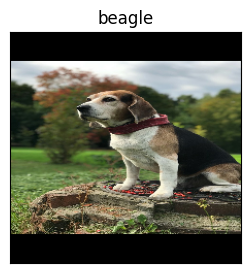

In [115]:
# check custom image predictions
plt.figure(figsize=(10, 3))
for i, image in enumerate(custom_images):
  plt.subplot(1, 1, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)